# Diagramación de una Chacra para Forestería Análoga

### © Equipo I+D SomosAZUCAR - Bajo licencia AGPLv3

```
Diagramador de Planos para Forestería Análoga
Copyright (C) 2015 Sebastian Silva

This program is free software: you can redistribute it and/or modify
it under the terms of the GNU Affero General Public License as published by
the Free Software Foundation, either version 3 of the License, or
(at your option) any later version.

This program is distributed in the hope that it will be useful,
but WITHOUT ANY WARRANTY; without even the implied warranty of
MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
GNU Affero General Public License for more details.

You should have received a copy of the GNU Affero General Public License
along with this program.  If not, see <http://www.gnu.org/licenses/>.
```

El software a continuación toma una selección de especies con una población propuesta e intenta ubicarla en un terreno según ciertas reglas.

In [2]:
# Bibliotecas utilizadas para confeccionar el mapa
%matplotlib inline
import matplotlib.pyplot as plt
from descartes import PolygonPatch
import matplotlib.cm as cmx
import matplotlib.colors as colors
import matplotlib.colorbar as colorbar
from shapely import geometry
from shapely import ops
import numpy as np
import pandas as pd
import random
import mpld3
from tqdm import tqdm

## 1.- BASE DE DATOS DE CULTIVOS DE BAJÍO AMAZÓNICO
### © Arbio - licencia por definir

La base de datos consiste en una lista de especies, cantidades, diámetro, y características.

In [3]:
especies = pd.read_csv("db_final.csv") ## Es una base
especies = especies[(especies.Usos=="Frutal")]
especies = especies.sort(['Altura.tot'], ascending=False)
#especies = especies.tail(15)
especies

,Usos,Nombre,Sp,Copa,Altura,Bajio,Enredadera,Productividad,Estrato,N,...,C11,C12,Sombra,Distancia,Diametro.dosel,Altura.tot,T1a.produccion,Trecambio,pond,ind
12,Frutal,Huasai brasilero / palmito,sp11,19.6,False,False,False,24.45,4,0,...,1,1,0.60,5,5,30,60,20,0.21,4
9,Frutal,Copaiba,sp11,113.1,False,False,False,9.55,5,0,...,2,2,0.50,8,12,28,96,30,0.08,4
16,Frutal,Pan de arbol,sp11,78.5,False,False,False,12.10,4,0,...,2,2,0.50,10,10,26,90,25,0.10,4
23,Frutal,Sangre grado,sp11,38.5,False,False,False,5.26,5,0,...,0,0,0.70,7,7,24,90,18,0.05,4
0,Frutal,Aguaje,sp1,28.3,False,True,False,21.22,4,0,...,1,2,0.00,18,6,20,90,45,0.18,4
24,Frutal,Sapote,sp11,113.1,False,False,False,7.37,4,0,...,0,0,0.65,12,12,20,102,18,0.06,4
18,Frutal,Pijuayo,sp11,19.6,False,False,False,3.82,4,0,...,0,0,0.00,6,5,20,42,20,0.03,4
13,Frutal,Mango,sp11,78.5,False,False,False,19.10,4,0,...,2,2,0.40,11,10,20,96,20,0.16,4
7,Frutal,Coco,sp11,19.6,False,True,False,1.68,4,0,...,0,0,0.00,10,5,20,60,50,0.01,4
25,Frutal,Shimbillo,sp36,28.3,False,False,False,3.09,3,1,...,0,0,0.00,5,6,16,54,15,0.03,7


In [4]:
consolidado = pd.DataFrame({'especies':especies.groupby('Estrato').size(), 
                            'individuos':especies.groupby('Estrato')['ind'].sum()})
pd.concat([consolidado,pd.DataFrame(consolidado.sum(axis=0),columns=['Total']).T])


,especies,individuos
Estrato,,
1,4,612
2,6,234
3,8,56
4,7,28
5,2,8
Total,27,938


## 2.- LINDEROS DE LA CHACRA

Los linderos están definidos como un polígono en metros, desde una de las esquinas.

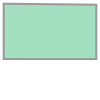

In [5]:
chacra = geometry.Polygon([ [0,0],
                            [0, 55],
                            [92, 54],
                            [92,0], 
                          ])
chacra

## 3.- Definir ubicaciones

In [6]:
def punto_aleatorio(poligono):
    (minx, miny, maxx, maxy) = poligono.bounds
    while True:
        p = geometry.Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
        if poligono.contains(p):
            return(p)

In [7]:
def get_colormap(N):
    color_norm  = colors.Normalize(vmin=0, vmax=N-1)
    scalar_map = cmx.ScalarMappable(norm=color_norm, cmap='terrain') 
    def map_index_to_rgb_color(index):
        return scalar_map.to_rgba(index)
    return map_index_to_rgb_color
# http://stackoverflow.com/questions/14720331/how-to-generate-random-colors-in-matplotlib

In [8]:
class Poblacion:
    def __init__(self, poligono, especies):
        self.poligono = poligono
        self.especies = especies
        individuos_columns = ['id', 'pos', 'x', 'y', 'color', 'Diametro.dosel', 
                              'Nombre', 'Estrato', 'Diametro.punto', 'Altura.tot']
        self.individuos = pd.DataFrame( columns=individuos_columns, )
        self.n_individuos = 0
        
        self.excluidos = pd.DataFrame( columns=individuos_columns, )
        self.inubicables = 0
        self.errores = []
        
        colores = get_colormap(len(especies))
        
        i=0
        for especie in tqdm(list(especies.itertuples())):
            i=i+1
            n_especie = especie[0]
            color_especie = colores(i)
            planta_tipo = especies.loc[n_especie]
            for n_individuo in range(especies.ind[n_especie]):
                self.n_individuos = self.n_individuos + 1
                planta = planta_tipo.copy()
                planta['id'] = n_especie
                planta = self.ubicar(planta)
                if planta['pos']:
                    planta['color'] = color_especie
                    planta['Diametro.dosel'] = float(planta['Diametro.dosel'])
                    planta['Diametro.punto'] = float(planta['Diametro.dosel']*10)
                    self.individuos.loc[self.n_individuos] = planta
                else:
                    self.excluidos.loc[self.inubicables] = planta
                self.individuos = self.individuos.dropna()
        
        self.individuos = self.individuos.sort(['Altura.tot'], ascending=False)

        if self.inubicables:
            print ("No se pudieron ubicar " + str(self.inubicables) + " individuos.")
            #self.inubicables = pd.DataFrame(self.inubicables)
                        
    def ubicar(self, planta):
        intentos = 5000
        while intentos:
            intentos = intentos - 1
            distancia_min = 1 # 1m
                
            pos = punto_aleatorio(self.poligono)       
            planta['pos'] = pos
            planta['x'], planta['y'] = pos.xy
            
            try:
                regla_1(self, planta)
                regla_2(self, planta)
                regla_3(self, planta)
            except ValueError as e:
                self.errores.append(str(e))
                next
            else:
                return planta
            
        self.inubicables = self.inubicables + 1
        planta['pos'] = None          
        return planta

In [9]:
def regla_1(poblacion, planta):
    if planta.Estrato < 3:
        if planta.pos.distance(poblacion.poligono.exterior) < planta['Altura.tot'] * 0.3:        
            raise ValueError('regla1')
    else:
        if planta.pos.distance(poblacion.poligono.exterior) < planta['Altura.tot'] * 0.65:        
            raise ValueError('regla1')

                
def regla_2(poblacion, planta):
    for anterior in poblacion.individuos.itertuples():
        if planta.Estrato < 3:
            distancia_min = (planta.Distancia / 2 ) - (planta.Distancia / 2) * planta.Sombra * 2
        else:
            distancia_min = planta.Distancia / 2
        if planta.pos.distance(anterior[2]) < distancia_min:
            raise ValueError('regla2')
            
def regla_3(poblacion, planta):
    mi_estrato = int(especies.Estrato[planta.id])
    mas_cercanos = []
    for anterior in poblacion.individuos.itertuples():
        if not mas_cercanos:
            mas_cercanos = [anterior]
        for cercano in mas_cercanos:
            if planta.pos.distance(anterior[2]) < planta.pos.distance(cercano[2]):
                mas_cercanos.append(anterior)
                if len(mas_cercanos) == 3:
                    mas_cercanos.pop(0)
                
    for cercano in mas_cercanos:
        if abs(especies.Estrato[int(cercano[1])] - mi_estrato) > 1:
            raise ValueError('regla3')

In [10]:
# Demora bastante
pob = Poblacion(chacra, especies)

In [11]:
print ("Se ubicaron %s de %s individuos." % 
        ( len(pob.individuos), especies.ind.sum(axis=0)))

Se ubicaron 938 de 938 individuos.


In [12]:
errores = pd.DataFrame({'error':pob.errores})
pd.DataFrame({'instancias':errores.groupby('error').size()})

,instancias
error,
regla1,812
regla2,860
regla3,153


In [13]:
pd.DataFrame({'excluidos':pob.excluidos.groupby('Nombre').size()})

,excluidos
Nombre,


## 4.- Graficar el mapa

Empezamos por los linderos de la chacra.

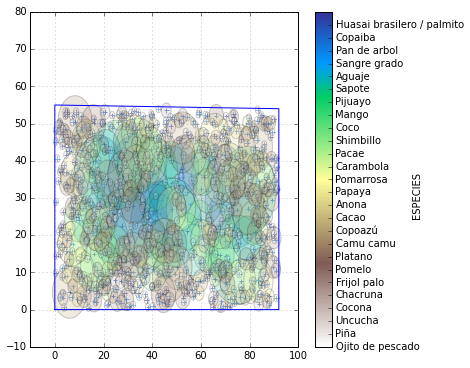

In [16]:
def createColourbar(lwr, upr):
    """Create a colourbar with limits of lwr and upr"""
    cax, kw = colorbar.make_axes(plt.gca())
    norm = colors.Normalize(vmin = lwr, vmax = upr, clip = False)

    c = colorbar.ColorbarBase(cax, cmap=plt.cm.get_cmap('terrain_r'), norm=norm)
    return c

fig = plt.figure(figsize=(6, 6))
chacra_x, chacra_y = chacra.exterior.xy
ax = fig.add_subplot(111)
ax.set_ylim(-10,80)
ax.set_xlim(-10,100)
ax.plot( *chacra.exterior.xy )

circulos = []
colores = []
puntos_x = []
puntos_y = []
labels = dict()
for planta in pob.individuos.iterrows():
    circulos.append(planta[1]['pos'].buffer(planta[1]['Diametro.dosel']))
    colores.append(planta[1]['color'])
    puntos_x.append(planta[1]['x'])
    puntos_y.append(planta[1]['y'])
    labels[planta[1]['id']]=planta[1]['Nombre']

i=0
for poligono in circulos:
    patch = PolygonPatch(poligono, fc=colores[i-1], alpha=0.2, zorder=1)
    ax.add_patch(patch)
    i = i+1

cm = plt.cm.get_cmap('terrain')
colores = [list(cm(x)) for x in range(len(pob.especies))]
colores = list(reversed(colores))

ax.grid(color='gray', alpha=0.9)

colormap = cmx.ScalarMappable(
            colors.Normalize(1, len(pob.especies)),
            plt.cm.get_cmap('terrain'))

ax.scatter(puntos_x, 
        puntos_y, 
        c=colores,
        s=20,
        cmap=colormap,
        vmin=0,
        vmax=len(pob.especies)-1,
        alpha=0.6, marker="+")

cb = createColourbar(0, len(pob.especies)-1)
cb.set_label('ESPECIES', labelpad=-50, y=0.45)

cb.set_ticks(list(reversed(range(0, len(pob.especies)-1))))
cb.set_ticklabels(list(pob.especies.Nombre))
try:
    cb.autoscale()
    fig.colorbar(cb)
except TypeError:
    pass


In [17]:
# Gráfico interactivo
mpld3.display(fig)

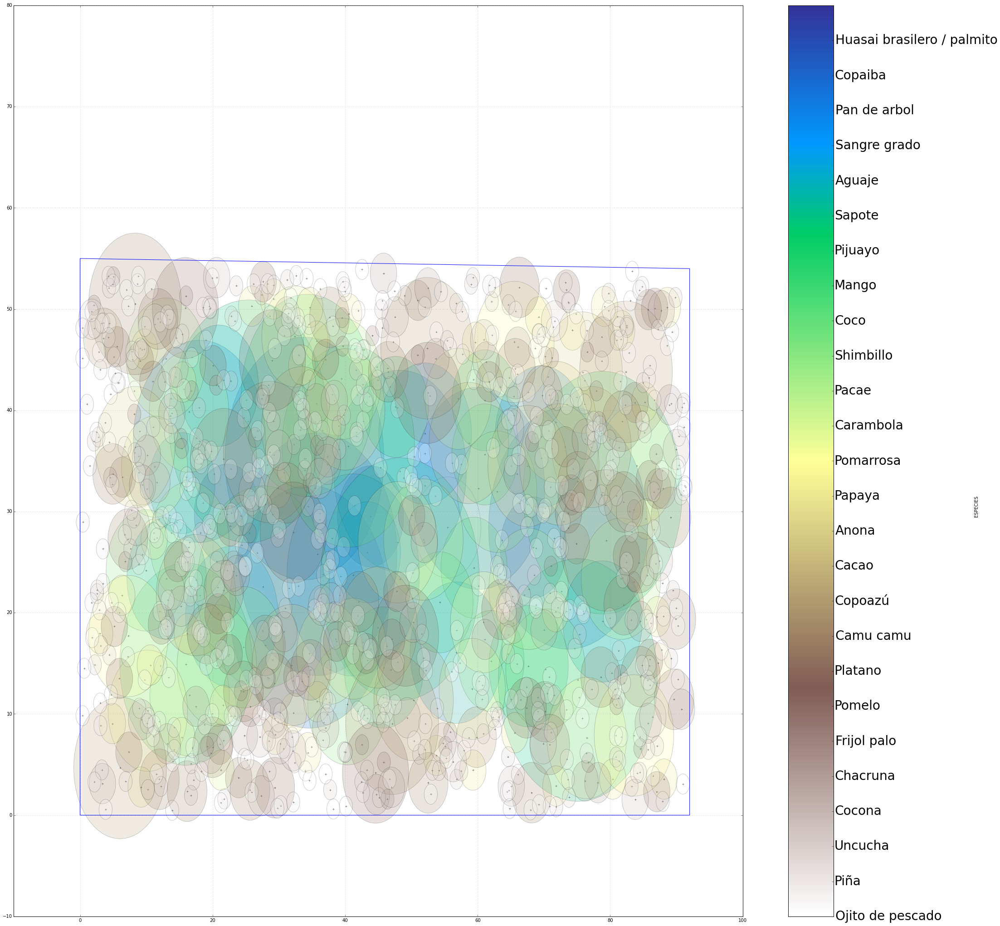

In [19]:
fig = plt.figure(figsize=(36, 36))
chacra_x, chacra_y = chacra.exterior.xy
ax = fig.add_subplot(111)
ax.set_ylim(-10,80)
ax.set_xlim(-10,100)
ax.plot( *chacra.exterior.xy )

circulos = []
colores = []
puntos_x = []
puntos_y = []
for planta in pob.individuos.iterrows():
    circulos.append(planta[1]['pos'].buffer(planta[1]['Diametro.dosel']))
    colores.append(planta[1]['color'])
    puntos_x.append(planta[1]['x'])
    puntos_y.append(planta[1]['y'])

i=0
for poligono in circulos:
    patch = PolygonPatch(poligono, fc=colores[i-1], alpha=0.2, zorder=1)
    ax.add_patch(patch)
    i = i+1
    
colores = [list(cm(x)) for x in range(len(pob.especies))]
colores = list(reversed(colores))

ax.grid(color='gray', alpha=0.9)

colormap = cmx.ScalarMappable(
            colors.Normalize(1, len(pob.especies)),
            plt.cm.get_cmap('terrain'))

ax.scatter(puntos_x, 
        puntos_y, 
        c=colores,
        color=[0,0,0],
        s=20,
        cmap=colormap,
        vmin=0,
        vmax=len(pob.especies)-1,
        alpha=0.6, marker="+")

cb = createColourbar(0, len(pob.especies)-1)
cb.set_label('ESPECIES', labelpad=-50, y=0.45)

cb.set_ticks(list(reversed(range(0, len(pob.especies)-1))))
cb.set_ticklabels(list(pob.especies.Nombre))
cb.ax.tick_params(labelsize=28) 
try:
    cb.autoscale()
    fig.colorbar(cb)    
except TypeError:
    pass
fig.savefig('mapa_b.png')
#
# *-* The End *-*